# U-Net Práctica 3 - Ablación y Simplificación

In [3]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image, ImageReadMode
import torchvision.transforms as T
import matplotlib.pyplot as plt
import os
from datetime import datetime

### Dataset

In [4]:
class UNetDataset(Dataset):
    def __init__(self, data_dir, label_dir):
        self.data_dir = data_dir
        self.label_dir = label_dir
        self.files = [os.path.splitext(f)[0] for f in os.listdir(data_dir)]
        self.transform = T.Resize((512, 512))

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_name = self.files[idx]
        image = read_image(os.path.join(self.data_dir, file_name + ".png"), mode=ImageReadMode.RGB)
        mask = read_image(os.path.join(self.label_dir, file_name + ".png"), mode=ImageReadMode.GRAY)
        
        image = self.transform(image) / 255.0
        mask = torch.round(self.transform(mask) / 255.0)
        
        return image.float(), mask.float()

In [5]:
# Configuración inicial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}\n")

train_dir = "./images"
label_dir = "./labels"
test_dir = "./test"
num_epochs = 200

ds_train = UNetDataset(train_dir, label_dir)
ds_train_loader = DataLoader(ds_train, batch_size=4, shuffle=True)

ds_test = UNetDataset(test_dir, label_dir)
ds_test_loader = DataLoader(ds_test, batch_size=4, shuffle=False)

all_results = []

Usando dispositivo: cuda



### Bloques U-Net

In [6]:
class ConvBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))
        return x


class EncoderBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv = ConvBlock(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, x):
        x = self.conv(x)
        p = self.pool(x)
        return x, p


class DecoderBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = ConvBlock(out_c + out_c, out_c)

    def forward(self, x, skip=None):
        x = self.up(x)
        if skip is not None:
            x = torch.cat([x, skip], dim=1)
        else:
            x = torch.cat([x, x], dim=1)  # Duplicar si no hay skip
        x = self.conv(x)
        return x


### Arquitectura U-Net configurable

In [7]:
class UNet(nn.Module):
    def __init__(self, base_channels=64, use_skips=[True, True, True, True]):
        """
        Args:
            base_channels: Canales base (se multiplican por 1, 2, 4, 8, 16)
            use_skips: Lista de 4 booleanos indicando qué skip connections usar
        """
        super().__init__()
        self.use_skips = use_skips
        self.base_channels = base_channels
        
        # Calcular canales para cada nivel
        c1 = base_channels
        c2 = base_channels * 2
        c3 = base_channels * 4
        c4 = base_channels * 8
        c5 = base_channels * 16
        
        # Encoder
        self.e1 = EncoderBlock(3, c1)
        self.e2 = EncoderBlock(c1, c2)
        self.e3 = EncoderBlock(c2, c3)
        self.e4 = EncoderBlock(c3, c4)
        
        # Bottleneck
        self.b = ConvBlock(c4, c5)
        
        # Decoder
        self.d1 = DecoderBlock(c5, c4)
        self.d2 = DecoderBlock(c4, c3)
        self.d3 = DecoderBlock(c3, c2)
        self.d4 = DecoderBlock(c2, c1)
        
        # Clasificador
        self.outputs = nn.Conv2d(c1, 1, kernel_size=1, padding=0)

    def forward(self, x):
        # Encoder
        s1, p1 = self.e1(x)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)
        
        # Bottleneck
        b = self.b(p4)
        
        # Decoder con skip connections opcionales
        d1 = self.d1(b, s4 if self.use_skips[3] else None)
        d2 = self.d2(d1, s3 if self.use_skips[2] else None)
        d3 = self.d3(d2, s2 if self.use_skips[1] else None)
        d4 = self.d4(d3, s1 if self.use_skips[0] else None)
        
        return self.outputs(d4)
    
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)


### Métricas

In [8]:
def calculate_iou(pred, target, threshold=0.5):
    """Calcula Intersection over Union (IoU)"""
    pred = (pred > threshold).float()
    target = (target > threshold).float()
    
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.item()


def calculate_dice(pred, target, threshold=0.5):
    """Calcula Dice coefficient"""
    pred = (pred > threshold).float()
    target = (target > threshold).float()
    
    intersection = (pred * target).sum()
    dice = (2. * intersection + 1e-6) / (pred.sum() + target.sum() + 1e-6)
    
    return dice.item()


def evaluate_model(model, dataloader, device='cuda'):
    """Evalúa el modelo en un dataset completo"""
    model.eval()
    total_loss = 0
    total_iou = 0
    total_dice = 0
    criterion = nn.MSELoss()
    
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            
            loss = criterion(outputs, labels)
            outputs_sigmoid = torch.sigmoid(outputs)
            
            total_loss += loss.item()
            total_iou += calculate_iou(outputs_sigmoid, labels)
            total_dice += calculate_dice(outputs_sigmoid, labels)
    
    n = len(dataloader)
    return {
        'loss': total_loss / n,
        'iou': total_iou / n,
        'dice': total_dice / n
    }


### Entrenamiento

In [9]:
def train_model(model, train_loader, test_loader, num_epochs=200, lr=1e-3, device='cuda'):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    
    history = {
        'train_loss': [],
        'test_loss': [],
        'test_iou': [],
        'test_dice': []
    }
    
    print(f"Parámetros del modelo: {model.count_parameters():,}")
    
    for epoch in range(num_epochs):
        # ENTRENAMIENTO
        model.train()
        epoch_loss = 0
        for images, labels in train_loader:
            outputs = model(images.to(device))
            loss = criterion(outputs, labels.to(device))
            
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
            epoch_loss += loss.item()
        
        avg_train_loss = epoch_loss / len(train_loader)
        history['train_loss'].append(avg_train_loss)
        
        # EVALUACIÓN EN TEST
        if (epoch + 1) % 20 == 0:
            metrics = evaluate_model(model, test_loader, device)
            history['test_loss'].append(metrics['loss'])
            history['test_iou'].append(metrics['iou'])
            history['test_dice'].append(metrics['dice'])
            
            print(f'Epoch [{epoch+1}/{num_epochs}] - Train Loss: {avg_train_loss:.4f} | '
                  f'Test Loss: {metrics["loss"]:.4f} | IoU: {metrics["iou"]:.4f} | Dice: {metrics["dice"]:.4f}')
    
    return history



### Visualización

In [10]:
def visualize_results(model, dataloader, device='cuda', num_samples=4, title=""):
    model.eval()
    
    it = iter(dataloader)
    img, label = next(it)
    
    with torch.no_grad():
        pred = model(img.to(device))
        pred = torch.sigmoid(pred)
    
    fig = plt.figure(figsize=(15, num_samples * 3))
    fig.suptitle(title, fontsize=16, fontweight='bold')
    
    for i in range(min(num_samples, len(img))):
        # Imagen original
        plt.subplot(num_samples, 3, 3*i + 1)
        plt.imshow(img[i].permute(1, 2, 0).cpu().numpy())
        plt.title('Original')
        plt.axis('off')
        
        # Ground truth
        plt.subplot(num_samples, 3, 3*i + 2)
        plt.imshow(label[i][0].cpu().numpy(), cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')
        
        # Predicción
        plt.subplot(num_samples, 3, 3*i + 3)
        plt.imshow(pred[i][0].cpu().numpy(), cmap='gray')
        plt.title('Predicción')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


def plot_training_curves(histories, labels):
    """Grafica curvas de entrenamiento para comparar modelos"""
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # Loss
    for history, label in zip(histories, labels):
        axes[0].plot(history['train_loss'][::5], label=label, alpha=0.7)
    axes[0].set_xlabel('Época (x5)')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # IoU
    for history, label in zip(histories, labels):
        axes[1].plot(history['test_iou'], label=label, marker='o', alpha=0.7)
    axes[1].set_xlabel('Evaluaciones (cada 20 épocas)')
    axes[1].set_ylabel('IoU')
    axes[1].set_title('IoU en Test')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    # Dice
    for history, label in zip(histories, labels):
        axes[2].plot(history['test_dice'], label=label, marker='o', alpha=0.7)
    axes[2].set_xlabel('Evaluaciones (cada 20 épocas)')
    axes[2].set_ylabel('Dice')
    axes[2].set_title('Dice Coefficient en Test')
    axes[2].legend()
    axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


### Tabla de resultados

In [11]:
def print_results_table(results):
    """Imprime tabla comparativa de resultados"""
    print("\n" + "="*100)
    print(f"{'Experimento':<40} | {'Parámetros':>12} | {'Loss Test':>10} | {'IoU':>8} | {'Dice':>8}")
    print("="*100)
    
    for exp in results:
        print(f"{exp['name']:<40} | {exp['params']:>12,} | {exp['loss']:>10.4f} | "
              f"{exp['iou']:>8.4f} | {exp['dice']:>8.4f}")
    
    print("="*100 + "\n")

### Experimentos completos

In [12]:
def run_complete_study(train_dir, label_dir, test_dir, num_epochs=200):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Usando dispositivo: {device}\n")
    
    # Cargar datasets
    ds_train = UNetDataset(train_dir, label_dir)
    ds_train_loader = DataLoader(ds_train, batch_size=4, shuffle=True)
    
    ds_test = UNetDataset(test_dir, label_dir)
    ds_test_loader = DataLoader(ds_test, batch_size=4, shuffle=False)
    
    all_results = []
    
    print("="*100)
    print("ESTUDIO COMPLETO U-NET: SIMPLIFICACIÓN Y ABLACIÓN")
    print("="*100)

## PARTE 1: MODELO BASELINE 


PARTE 1: MODELO BASELINE - U-Net completa (64 canales base)
Parámetros del modelo: 31,043,521
Epoch [20/200] - Train Loss: 0.0068 | Test Loss: 0.1594 | IoU: 0.0947 | Dice: 0.1730
Epoch [40/200] - Train Loss: 0.0021 | Test Loss: 0.0597 | IoU: 0.1576 | Dice: 0.2723
Epoch [60/200] - Train Loss: 0.0014 | Test Loss: 0.0447 | IoU: 0.1159 | Dice: 0.2077
Epoch [80/200] - Train Loss: 0.0013 | Test Loss: 0.0487 | IoU: 0.1170 | Dice: 0.2095
Epoch [100/200] - Train Loss: 0.0010 | Test Loss: 0.0493 | IoU: 0.1162 | Dice: 0.2081
Epoch [120/200] - Train Loss: 0.0009 | Test Loss: 0.0487 | IoU: 0.1131 | Dice: 0.2032
Epoch [140/200] - Train Loss: 0.0009 | Test Loss: 0.0491 | IoU: 0.1251 | Dice: 0.2224
Epoch [160/200] - Train Loss: 0.0008 | Test Loss: 0.0492 | IoU: 0.1249 | Dice: 0.2220
Epoch [180/200] - Train Loss: 0.0008 | Test Loss: 0.0495 | IoU: 0.1257 | Dice: 0.2233
Epoch [200/200] - Train Loss: 0.0007 | Test Loss: 0.0488 | IoU: 0.1427 | Dice: 0.2498

--- Visualización en TRAIN ---


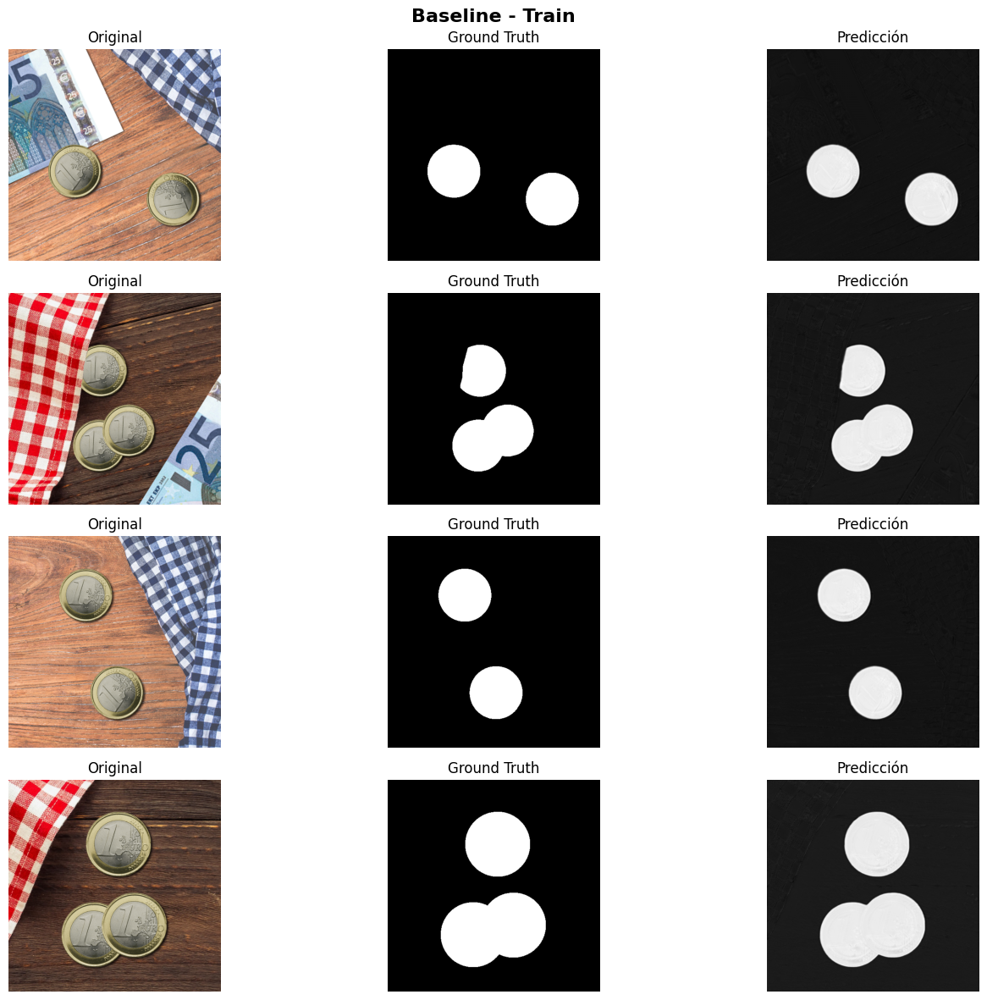


--- Visualización en TEST ---


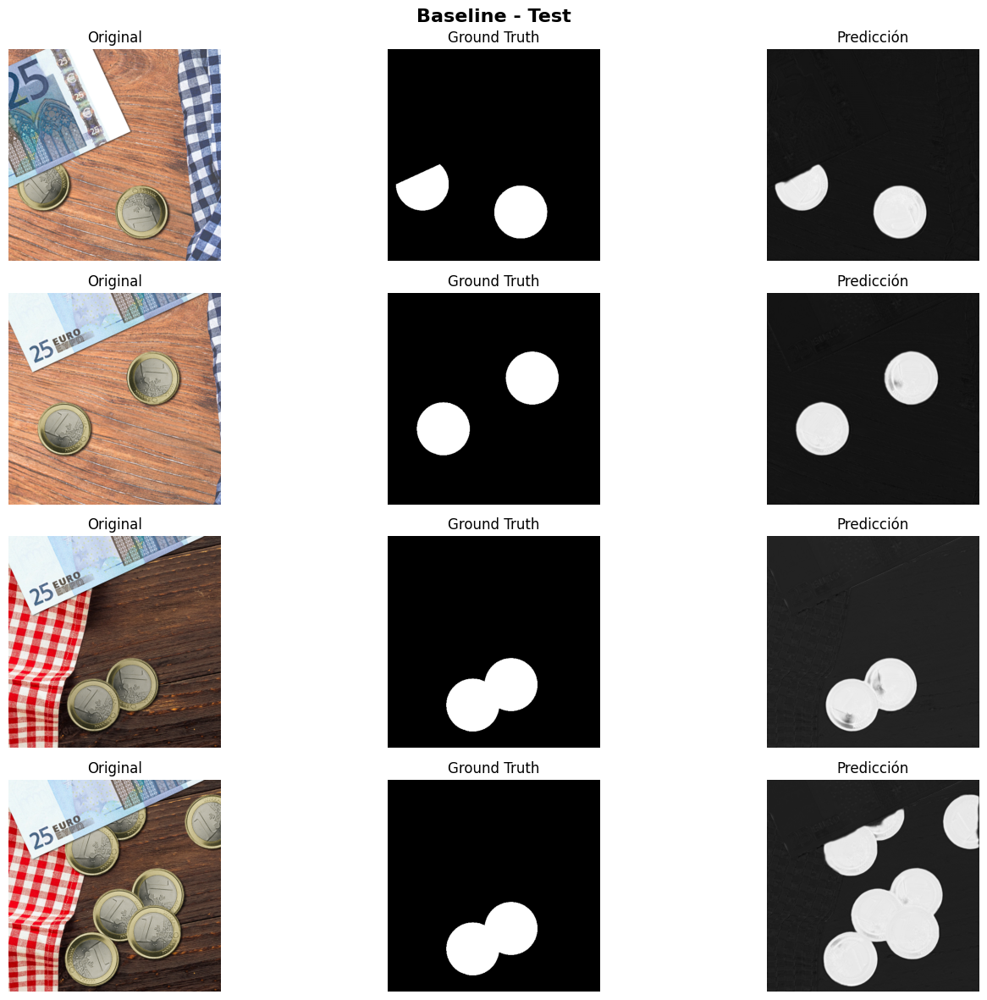

In [13]:
print("\n" + "="*100)
print("PARTE 1: MODELO BASELINE - U-Net completa (64 canales base)")
print("="*100)
    
model_baseline = UNet(base_channels=64, use_skips=[True, True, True, True]).to(device)
history_baseline = train_model(model_baseline, ds_train_loader, ds_test_loader, num_epochs, device=device)
metrics_baseline = evaluate_model(model_baseline, ds_test_loader, device)
    
all_results.append({
    'name': 'Baseline (64 canales, 4 skips)',
    'params': model_baseline.count_parameters(),
    'loss': metrics_baseline['loss'],
    'iou': metrics_baseline['iou'],
    'dice': metrics_baseline['dice']
    })
    
print("\n--- Visualización en TRAIN ---")
visualize_results(model_baseline, ds_train_loader, device, title="Baseline - Train")
print("\n--- Visualización en TEST ---")
visualize_results(model_baseline, ds_test_loader, device, title="Baseline - Test")

## PARTE 2: REDUCCIÓN PROGRESIVA DE CANALES


PARTE 2: SIMPLIFICACIÓN - Reducción progresiva de canales

Probando con 32 canales base
Parámetros del modelo: 7,765,985
Epoch [20/200] - Train Loss: 0.0058 | Test Loss: 0.1028 | IoU: 0.1190 | Dice: 0.2127
Epoch [40/200] - Train Loss: 0.0025 | Test Loss: 0.0475 | IoU: 0.1693 | Dice: 0.2896
Epoch [60/200] - Train Loss: 0.0019 | Test Loss: 0.0398 | IoU: 0.1768 | Dice: 0.3005
Epoch [80/200] - Train Loss: 0.0016 | Test Loss: 0.0442 | IoU: 0.1701 | Dice: 0.2907
Epoch [100/200] - Train Loss: 0.0014 | Test Loss: 0.0430 | IoU: 0.1743 | Dice: 0.2968
Epoch [120/200] - Train Loss: 0.0014 | Test Loss: 0.0458 | IoU: 0.1732 | Dice: 0.2953
Epoch [140/200] - Train Loss: 0.0012 | Test Loss: 0.0432 | IoU: 0.1667 | Dice: 0.2857
Epoch [160/200] - Train Loss: 0.0011 | Test Loss: 0.0427 | IoU: 0.1657 | Dice: 0.2843
Epoch [180/200] - Train Loss: 0.0010 | Test Loss: 0.0446 | IoU: 0.1565 | Dice: 0.2707
Epoch [200/200] - Train Loss: 0.0011 | Test Loss: 0.0486 | IoU: 0.1512 | Dice: 0.2627

--- Visualización TES

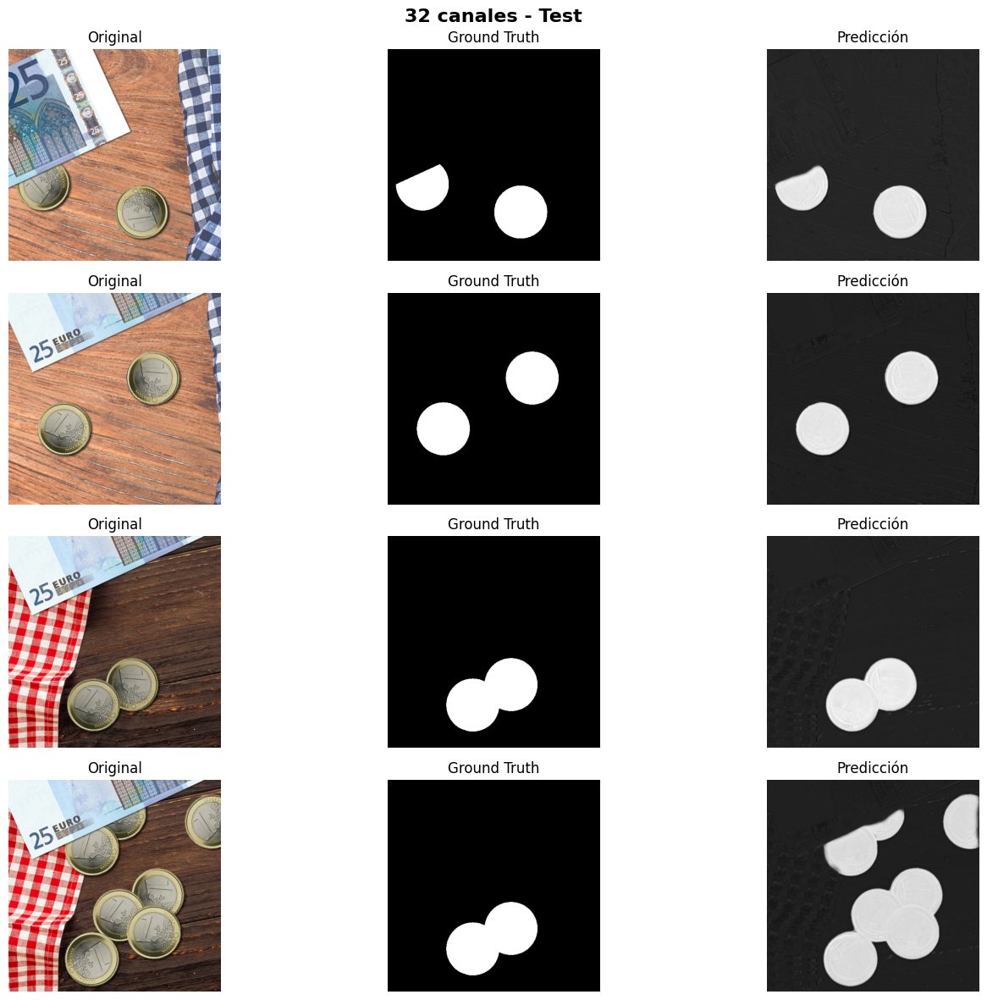


Probando con 16 canales base
Parámetros del modelo: 1,944,049
Epoch [20/200] - Train Loss: 0.0082 | Test Loss: 0.3493 | IoU: 0.1028 | Dice: 0.1865
Epoch [40/200] - Train Loss: 0.0037 | Test Loss: 0.0582 | IoU: 0.1311 | Dice: 0.2318
Epoch [60/200] - Train Loss: 0.0025 | Test Loss: 0.0392 | IoU: 0.1452 | Dice: 0.2536
Epoch [80/200] - Train Loss: 0.0022 | Test Loss: 0.0456 | IoU: 0.1553 | Dice: 0.2689
Epoch [100/200] - Train Loss: 0.0018 | Test Loss: 0.0432 | IoU: 0.1583 | Dice: 0.2734
Epoch [120/200] - Train Loss: 0.0018 | Test Loss: 0.0545 | IoU: 0.1564 | Dice: 0.2705
Epoch [140/200] - Train Loss: 0.0015 | Test Loss: 0.0448 | IoU: 0.1616 | Dice: 0.2782
Epoch [160/200] - Train Loss: 0.0014 | Test Loss: 0.0472 | IoU: 0.1593 | Dice: 0.2748
Epoch [180/200] - Train Loss: 0.0014 | Test Loss: 0.0520 | IoU: 0.1619 | Dice: 0.2787
Epoch [200/200] - Train Loss: 0.0012 | Test Loss: 0.0462 | IoU: 0.1619 | Dice: 0.2787

--- Visualización TEST (16 canales) ---


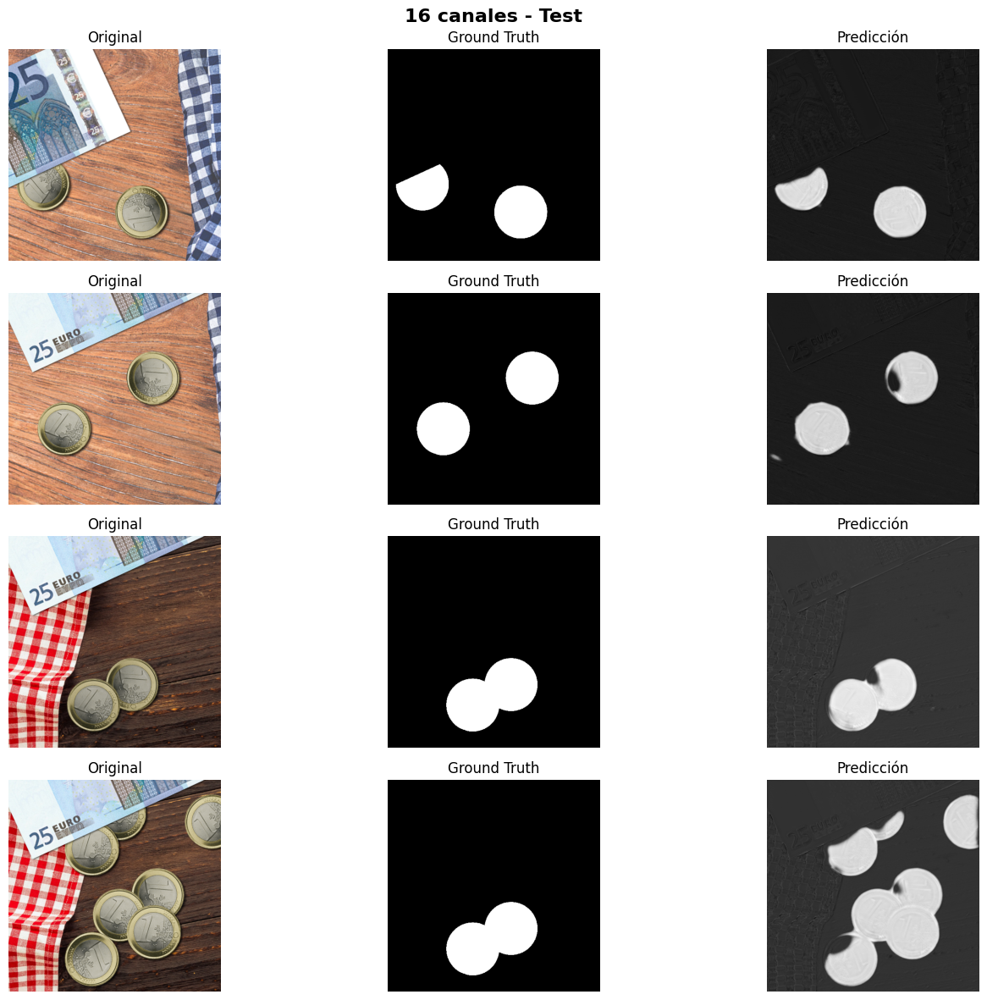


Probando con 8 canales base
Parámetros del modelo: 487,289
Epoch [20/200] - Train Loss: 0.1449 | Test Loss: 0.1896 | IoU: 0.0005 | Dice: 0.0009
Epoch [40/200] - Train Loss: 0.0647 | Test Loss: 0.0926 | IoU: 0.4874 | Dice: 0.6554
Epoch [60/200] - Train Loss: 0.0368 | Test Loss: 0.0759 | IoU: 0.5342 | Dice: 0.6964
Epoch [80/200] - Train Loss: 0.0249 | Test Loss: 0.0734 | IoU: 0.5138 | Dice: 0.6788
Epoch [100/200] - Train Loss: 0.0197 | Test Loss: 0.0647 | IoU: 0.4935 | Dice: 0.6609
Epoch [120/200] - Train Loss: 0.0106 | Test Loss: 0.0544 | IoU: 0.3981 | Dice: 0.5695
Epoch [140/200] - Train Loss: 0.0059 | Test Loss: 0.0504 | IoU: 0.2965 | Dice: 0.4573
Epoch [160/200] - Train Loss: 0.0038 | Test Loss: 0.0481 | IoU: 0.2752 | Dice: 0.4316
Epoch [180/200] - Train Loss: 0.0029 | Test Loss: 0.0512 | IoU: 0.2254 | Dice: 0.3679
Epoch [200/200] - Train Loss: 0.0022 | Test Loss: 0.0484 | IoU: 0.1914 | Dice: 0.3213

--- Visualización TEST (8 canales) ---


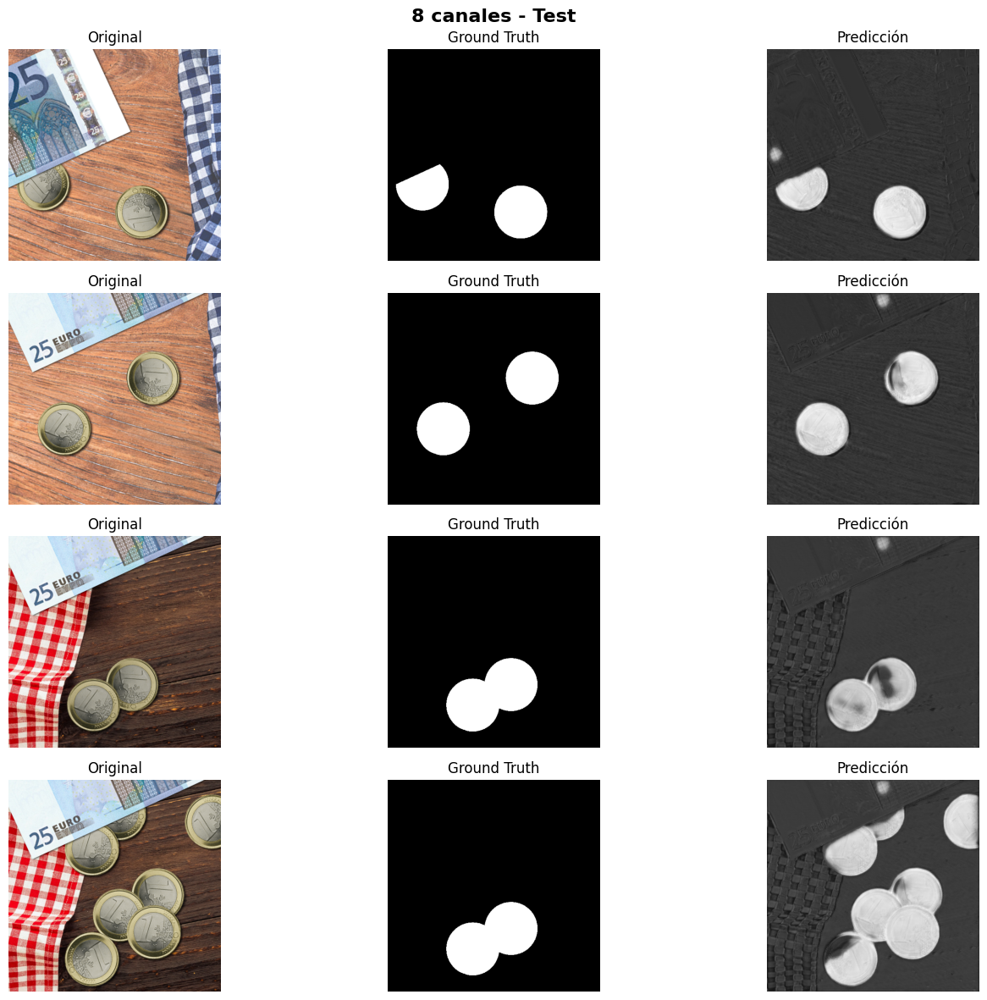


Probando con 4 canales base
Parámetros del modelo: 122,461
Epoch [20/200] - Train Loss: 0.2249 | Test Loss: 0.1109 | IoU: 0.0000 | Dice: 0.0000
Epoch [40/200] - Train Loss: 0.1457 | Test Loss: 0.1231 | IoU: 0.0078 | Dice: 0.0155
Epoch [60/200] - Train Loss: 0.1301 | Test Loss: 0.0932 | IoU: 0.1692 | Dice: 0.2894
Epoch [80/200] - Train Loss: 0.1260 | Test Loss: 0.0898 | IoU: 0.1433 | Dice: 0.2507
Epoch [100/200] - Train Loss: 0.1227 | Test Loss: 0.0879 | IoU: 0.1382 | Dice: 0.2429
Epoch [120/200] - Train Loss: 0.1093 | Test Loss: 0.0870 | IoU: 0.1320 | Dice: 0.2333
Epoch [140/200] - Train Loss: 0.0888 | Test Loss: 0.0684 | IoU: 0.1033 | Dice: 0.1872
Epoch [160/200] - Train Loss: 0.0646 | Test Loss: 0.0609 | IoU: 0.1332 | Dice: 0.2352
Epoch [180/200] - Train Loss: 0.0359 | Test Loss: 0.0532 | IoU: 0.1640 | Dice: 0.2818
Epoch [200/200] - Train Loss: 0.0189 | Test Loss: 0.0429 | IoU: 0.1499 | Dice: 0.2608

--- Visualización TEST (4 canales) ---


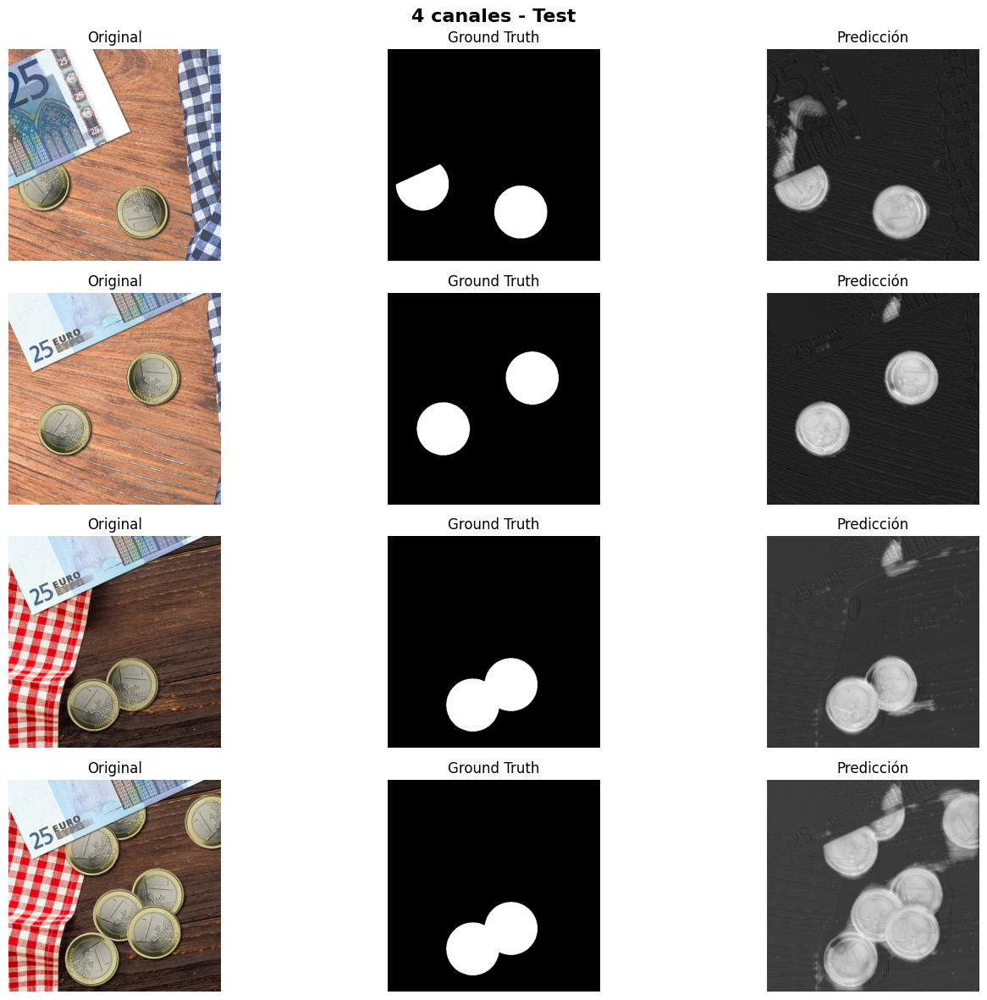


--- Comparación de Simplificación de Canales ---


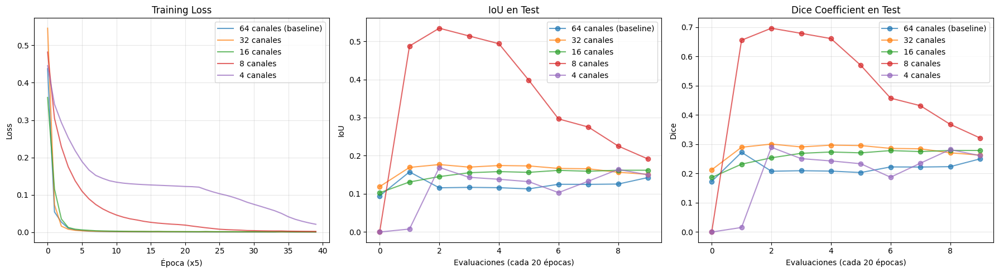

In [16]:
print("\n" + "="*100)
print("PARTE 2: SIMPLIFICACIÓN - Reducción progresiva de canales")
print("="*100)
    
channel_configs = [32, 16, 8, 4]
histories_channels = [history_baseline]
labels_channels = ['64 canales (baseline)']
    
for channels in channel_configs:
    print(f"\n{'='*50}")
    print(f"Probando con {channels} canales base")
    print(f"{'='*50}")
        
    model = UNet(base_channels=channels, use_skips=[True, True, True, True]).to(device)
    history = train_model(model, ds_train_loader, ds_test_loader, num_epochs, device=device)
    metrics = evaluate_model(model, ds_test_loader, device)
        
    all_results.append({
        'name': f'{channels} canales base (4 skips)',
        'params': model.count_parameters(),
        'loss': metrics['loss'],
        'iou': metrics['iou'],
        'dice': metrics['dice']
        })
        
    histories_channels.append(history)
    labels_channels.append(f'{channels} canales')
        
    print(f"\n--- Visualización TEST ({channels} canales) ---")
    visualize_results(model, ds_test_loader, device, title=f"{channels} canales - Test")
    
print("\n--- Comparación de Simplificación de Canales ---")
plot_training_curves(histories_channels, labels_channels)

## PARTE 3: ABLACIÓN DE SKIP CONNECTIONS


PARTE 3: ABLACIÓN - Eliminación progresiva de skip connections

Probando: 3 skips (sin skip 4)
Parámetros del modelo: 31,043,521
Epoch [20/200] - Train Loss: 0.0060 | Test Loss: 0.1633 | IoU: 0.0933 | Dice: 0.1706
Epoch [40/200] - Train Loss: 0.0023 | Test Loss: 0.0688 | IoU: 0.1149 | Dice: 0.2061
Epoch [60/200] - Train Loss: 0.0017 | Test Loss: 0.0420 | IoU: 0.1118 | Dice: 0.2011
Epoch [80/200] - Train Loss: 0.0014 | Test Loss: 0.0387 | IoU: 0.1197 | Dice: 0.2138
Epoch [100/200] - Train Loss: 0.0012 | Test Loss: 0.0390 | IoU: 0.1273 | Dice: 0.2258
Epoch [120/200] - Train Loss: 0.0011 | Test Loss: 0.0379 | IoU: 0.1277 | Dice: 0.2265
Epoch [140/200] - Train Loss: 0.0021 | Test Loss: 0.0555 | IoU: 0.1265 | Dice: 0.2246
Epoch [160/200] - Train Loss: 0.0011 | Test Loss: 0.0494 | IoU: 0.1618 | Dice: 0.2786
Epoch [180/200] - Train Loss: 0.0009 | Test Loss: 0.0478 | IoU: 0.1379 | Dice: 0.2424
Epoch [200/200] - Train Loss: 0.0008 | Test Loss: 0.0445 | IoU: 0.1421 | Dice: 0.2488

--- Visualiza

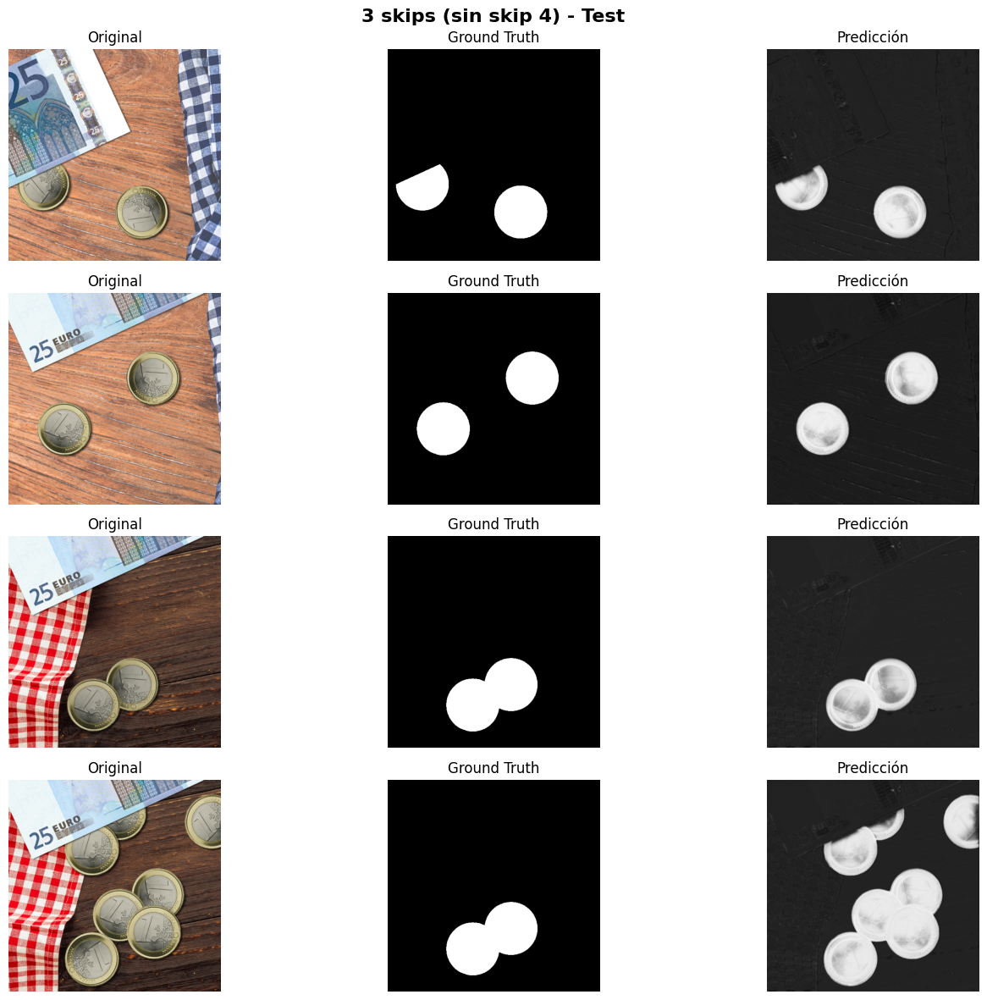


Probando: 2 skips (sin skip 3 y 4)
Parámetros del modelo: 31,043,521
Epoch [20/200] - Train Loss: 0.0127 | Test Loss: 0.1211 | IoU: 0.0943 | Dice: 0.1723
Epoch [40/200] - Train Loss: 0.0031 | Test Loss: 0.0452 | IoU: 0.1658 | Dice: 0.2844
Epoch [60/200] - Train Loss: 0.0018 | Test Loss: 0.0465 | IoU: 0.1665 | Dice: 0.2855
Epoch [80/200] - Train Loss: 0.0014 | Test Loss: 0.0481 | IoU: 0.1389 | Dice: 0.2439
Epoch [100/200] - Train Loss: 0.0013 | Test Loss: 0.0484 | IoU: 0.1422 | Dice: 0.2490
Epoch [120/200] - Train Loss: 0.0012 | Test Loss: 0.0487 | IoU: 0.1498 | Dice: 0.2606
Epoch [140/200] - Train Loss: 0.0010 | Test Loss: 0.0482 | IoU: 0.1541 | Dice: 0.2670
Epoch [160/200] - Train Loss: 0.0012 | Test Loss: 0.0498 | IoU: 0.1944 | Dice: 0.3255
Epoch [180/200] - Train Loss: 0.0010 | Test Loss: 0.0493 | IoU: 0.1490 | Dice: 0.2594
Epoch [200/200] - Train Loss: 0.0009 | Test Loss: 0.0483 | IoU: 0.1652 | Dice: 0.2836

--- Visualización TEST (2 skips (sin skip 3 y 4)) ---


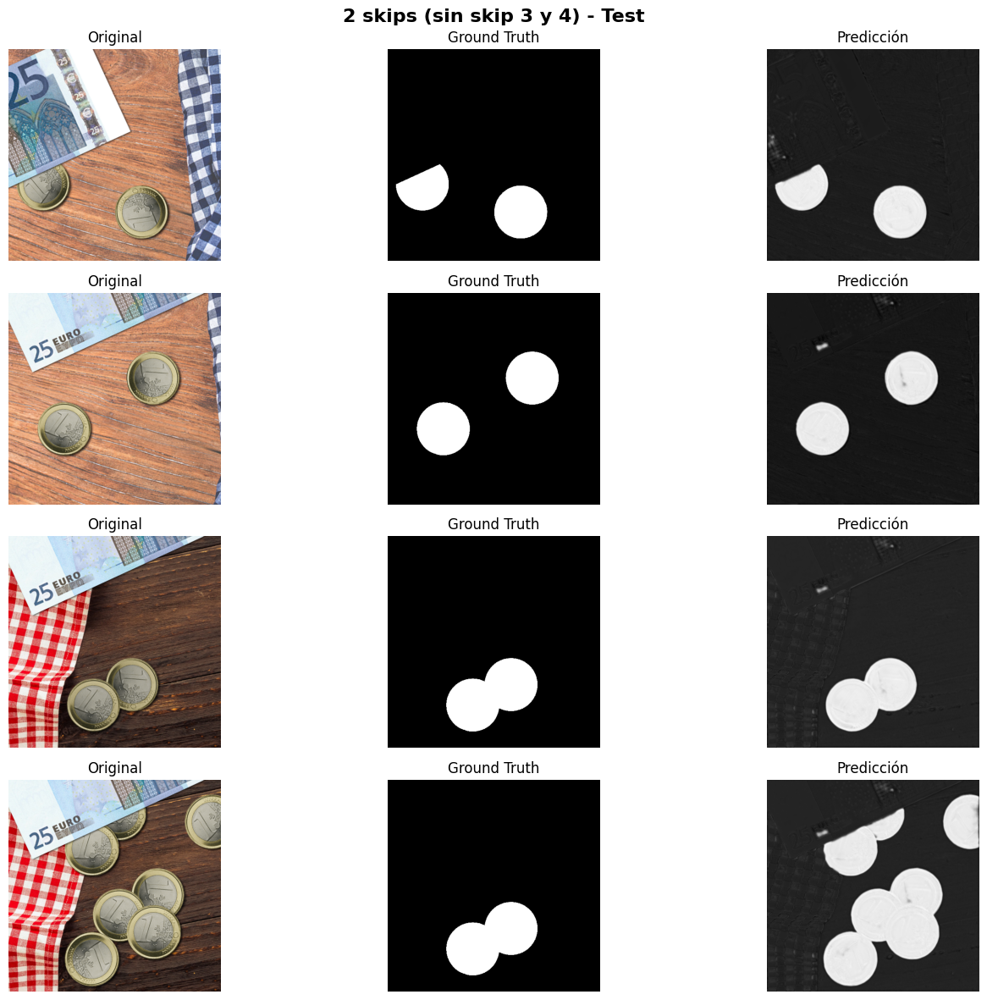


Probando: 1 skip (solo skip 1)
Parámetros del modelo: 31,043,521
Epoch [20/200] - Train Loss: 0.0135 | Test Loss: 0.0883 | IoU: 0.0995 | Dice: 0.1810
Epoch [40/200] - Train Loss: 0.0065 | Test Loss: 0.0496 | IoU: 0.1895 | Dice: 0.3186
Epoch [60/200] - Train Loss: 0.0042 | Test Loss: 0.0468 | IoU: 0.2086 | Dice: 0.3451
Epoch [80/200] - Train Loss: 0.0031 | Test Loss: 0.0470 | IoU: 0.2244 | Dice: 0.3665
Epoch [100/200] - Train Loss: 0.0024 | Test Loss: 0.0466 | IoU: 0.2520 | Dice: 0.4025
Epoch [120/200] - Train Loss: 0.0020 | Test Loss: 0.0473 | IoU: 0.2360 | Dice: 0.3818
Epoch [140/200] - Train Loss: 0.0017 | Test Loss: 0.0478 | IoU: 0.2033 | Dice: 0.3379
Epoch [160/200] - Train Loss: 0.0015 | Test Loss: 0.0483 | IoU: 0.1858 | Dice: 0.3134
Epoch [180/200] - Train Loss: 0.0013 | Test Loss: 0.0489 | IoU: 0.1836 | Dice: 0.3102
Epoch [200/200] - Train Loss: 0.0012 | Test Loss: 0.0492 | IoU: 0.1878 | Dice: 0.3162

--- Visualización TEST (1 skip (solo skip 1)) ---


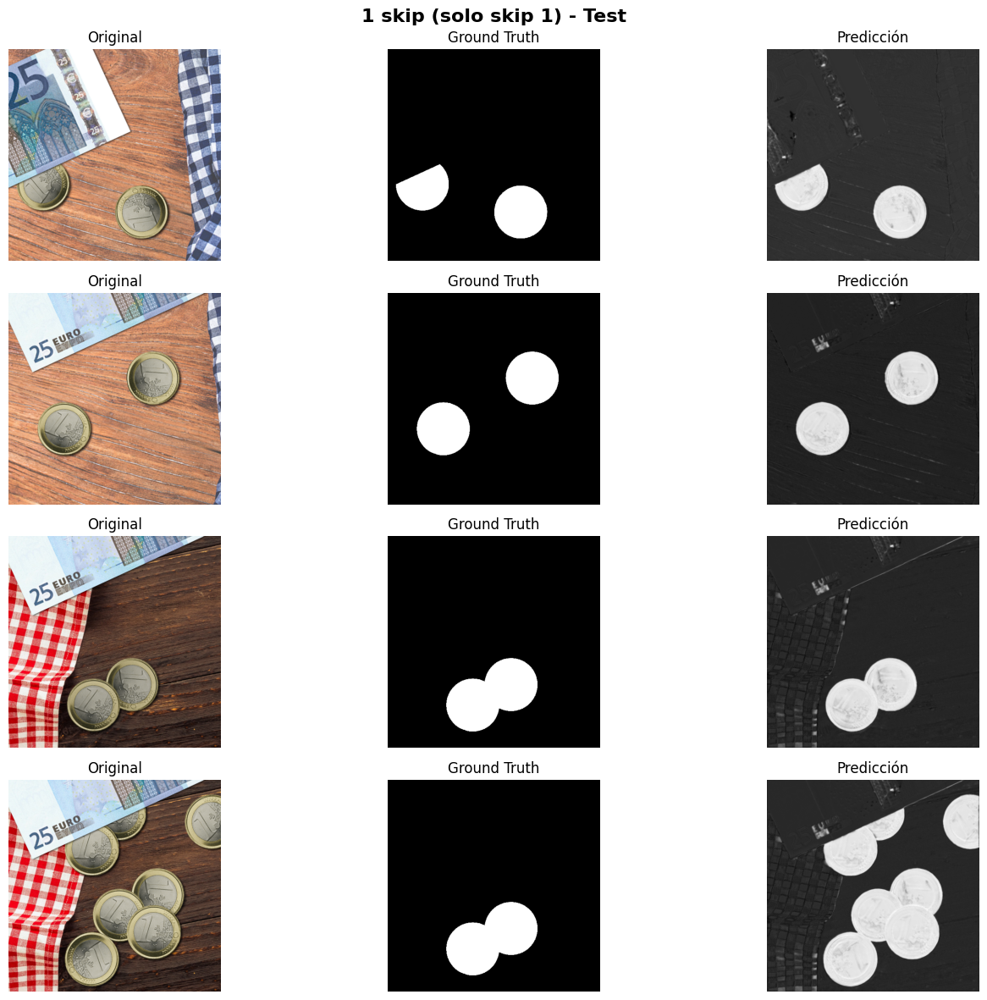


Probando: Sin skips
Parámetros del modelo: 31,043,521
Epoch [20/200] - Train Loss: 0.0169 | Test Loss: 51.0522 | IoU: 0.0927 | Dice: 0.1697
Epoch [40/200] - Train Loss: 0.0103 | Test Loss: 0.2586 | IoU: 0.1169 | Dice: 0.2093
Epoch [60/200] - Train Loss: 0.0069 | Test Loss: 0.0366 | IoU: 0.1693 | Dice: 0.2896
Epoch [80/200] - Train Loss: 0.0046 | Test Loss: 0.0410 | IoU: 0.5938 | Dice: 0.7451
Epoch [100/200] - Train Loss: 0.0033 | Test Loss: 0.0497 | IoU: 0.6065 | Dice: 0.7551
Epoch [120/200] - Train Loss: 0.0024 | Test Loss: 0.0411 | IoU: 0.5280 | Dice: 0.6911
Epoch [140/200] - Train Loss: 0.0019 | Test Loss: 0.0442 | IoU: 0.1007 | Dice: 0.1829
Epoch [160/200] - Train Loss: 0.0017 | Test Loss: 0.0482 | IoU: 0.2227 | Dice: 0.3643
Epoch [180/200] - Train Loss: 0.0014 | Test Loss: 0.0474 | IoU: 0.2161 | Dice: 0.3554
Epoch [200/200] - Train Loss: 0.0014 | Test Loss: 0.0467 | IoU: 0.2678 | Dice: 0.4225

--- Visualización TEST (Sin skips) ---


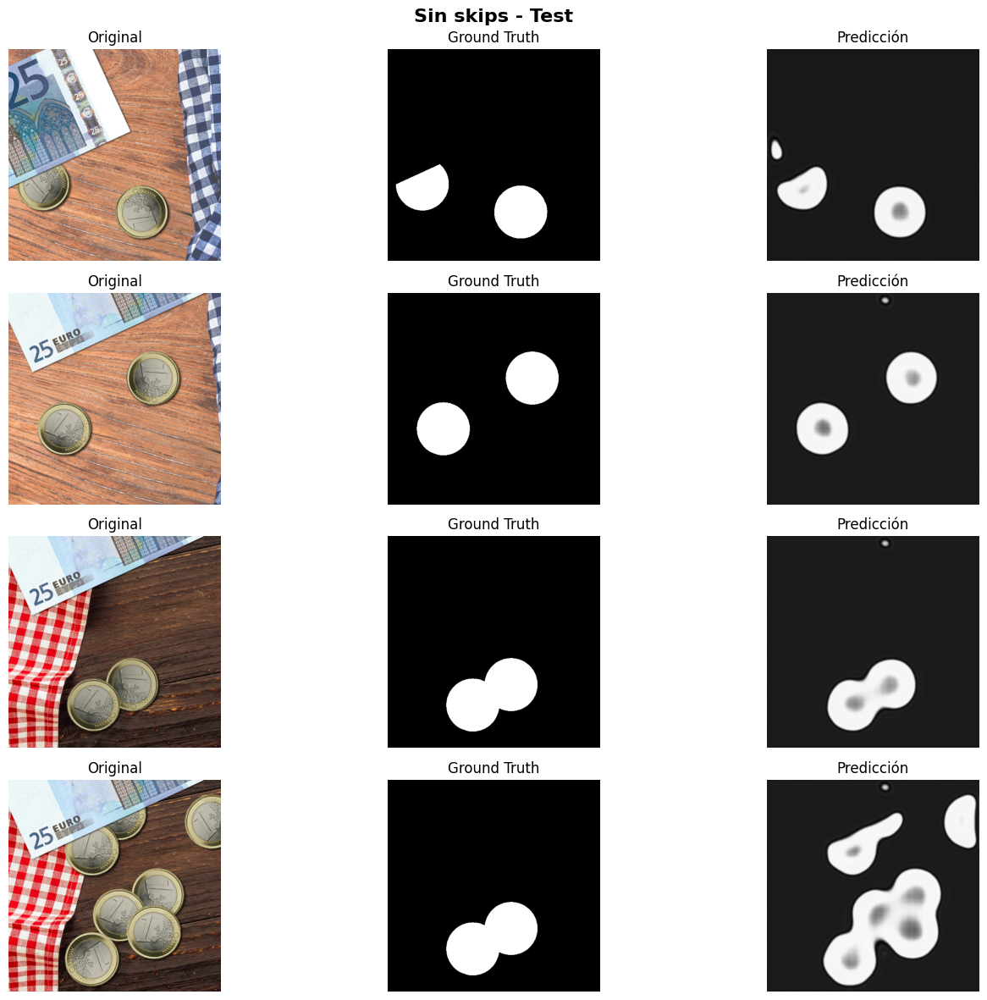


--- Comparación de Ablación de Skip Connections ---


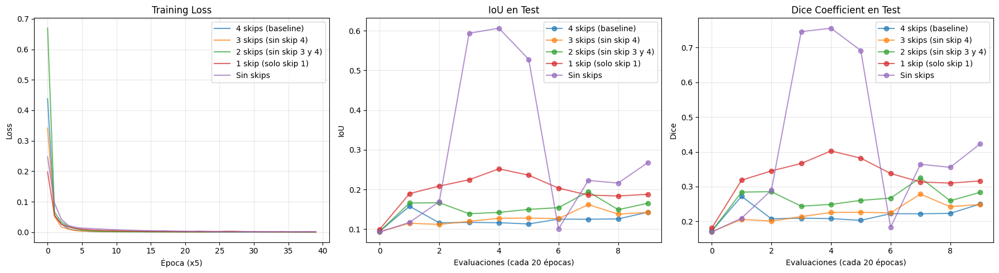

In [17]:
print("\n" + "="*100)
print("PARTE 3: ABLACIÓN - Eliminación progresiva de skip connections")
print("="*100)
    
skip_configs = [
    ([True, True, True, False], "3 skips (sin skip 4)"),
    ([True, True, False, False], "2 skips (sin skip 3 y 4)"),
    ([True, False, False, False], "1 skip (solo skip 1)"),
    ([False, False, False, False], "Sin skips"),
    ]
    
histories_skips = [history_baseline]
labels_skips = ['4 skips (baseline)']
    
for use_skips, desc in skip_configs:
    print(f"\n{'='*50}")
    print(f"Probando: {desc}")
    print(f"{'='*50}")
        
    model = UNet(base_channels=64, use_skips=use_skips).to(device)
    history = train_model(model, ds_train_loader, ds_test_loader, num_epochs, device=device)
    metrics = evaluate_model(model, ds_test_loader, device)
        
    all_results.append({
        'name': f'64 canales - {desc}',
        'params': model.count_parameters(),
        'loss': metrics['loss'],
        'iou': metrics['iou'],
        'dice': metrics['dice']
        })
        
    histories_skips.append(history)
    labels_skips.append(desc)
        
    print(f"\n--- Visualización TEST ({desc}) ---")
    visualize_results(model, ds_test_loader, device, title=f"{desc} - Test")
    
print("\n--- Comparación de Ablación de Skip Connections ---")
plot_training_curves(histories_skips, labels_skips)

## RESUMEN FINAL

In [18]:
print("\n" + "="*100)
print("RESUMEN FINAL - TODOS LOS EXPERIMENTOS")
print("="*100)
print_results_table(all_results)



RESUMEN FINAL - TODOS LOS EXPERIMENTOS

Experimento                              |   Parámetros |  Loss Test |      IoU |     Dice
Baseline (64 canales, 4 skips)           |   31,043,521 |     0.0488 |   0.1427 |   0.2498
32 canales base (4 skips)                |    7,765,985 |     0.0486 |   0.1512 |   0.2627
16 canales base (4 skips)                |    1,944,049 |     0.0462 |   0.1619 |   0.2787
8 canales base (4 skips)                 |      487,289 |     0.0484 |   0.1914 |   0.3213
4 canales base (4 skips)                 |      122,461 |     0.0429 |   0.1499 |   0.2608
64 canales - 3 skips (sin skip 4)        |   31,043,521 |     0.0445 |   0.1421 |   0.2488
64 canales - 2 skips (sin skip 3 y 4)    |   31,043,521 |     0.0483 |   0.1652 |   0.2836
64 canales - 1 skip (solo skip 1)        |   31,043,521 |     0.0492 |   0.1878 |   0.3162
64 canales - Sin skips                   |   31,043,521 |     0.0467 |   0.2678 |   0.4225

